In [1]:
import torch,torchvision,os,PIL,pdb
from torch import nn
from torch.utils.data import Dataset
from torch.utils.data import DataLoader
from torchvision import transforms
from torchvision.utils import make_grid
from tqdm.auto import tqdm
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

def show(tensor,num=25,wandbactive=0,name=''):
  data = tensor.detach().cpu()
  grid = make_grid(data[:num],nrow=5).permute(1,2,0)
  if (wandbactive ==1 and wandbact==1):
    wandb.log({name:wandb.Image(grid.numpy().clip(0,1))})

  plt.imshow(grid.clip(0,1))
  plt.show()


# hyprerparamters and general parameters
n_epochs = 10000
batch_size=128
lr=1e-4
z_dim = 200
device ='cuda'

cur_step = 0
crit_cycles=5    # 5 times cycle discriminator/critic is trained and 1 times generator, where as in normal GAN, it was 1 generator and 1 discriminator
gen_losses=[]
crit_losses=[]
show_step=35
save_step=35

wandbact =1 # yes. we want to track stats through weights and biases(optional)

In [2]:
!pip install wandb -qqq
import wandb
wandb.login(key="")

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 9.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 188.5/188.5 kB 6.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 214.7/214.7 kB 13.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 7.4 MB/s eta 0:00:00


<IPython.core.display.Javascript object>

wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


True

In [3]:
%%capture
# experiment_name = wandb.util.generate_id()

myrun=wandb.init(
    project="wgan",
    group="v3kvfs9p",
    config={
        "optimizer":"sgd",
        "model":"wgan gp",
        "epoch":"1000",
        "batch_size":128
    }
)

config=wandb.config


In [ ]:
print(experiment_name)

In [24]:
from torch.nn.modules import BatchNorm2d
from torch.nn.modules.conv import ConvTranspose2d

# generator model


class Generator(nn.Module):
    def __init__(self, z_dim=64, d_dim=16):
        super(Generator, self).__init__()
        self.z_dim = z_dim

        self.gen = nn.Sequential(
            ## ConvTranspose2d: in_chanels(dim of the latent space rather than image pixels),out_channels, kernel_size, stride=1,padding=0
            ## Calculating new width and height: (n-1)*stride -2*padding +ks
            ## n=width or height
            ## ks = kernel size
            ## we begin with 1x1 image with z_dim number of channels(200)
            nn.ConvTranspose2d(
                z_dim, d_dim * 32, 4, 1, 0
            ),  ## 4x4 image (ch: 200 to 512) z_dim = 200, d_dim = 16*32=512
            nn.BatchNorm2d(d_dim * 32),
            nn.ReLU(True),

            nn.ConvTranspose2d(
                d_dim * 32, d_dim * 16, 4, 2, 1
            ),  ## 8x8 (ch: 512 to 256)  image size increases by multiplying with kernal and reducing the channel size
            nn.BatchNorm2d(d_dim * 16),
            nn.ReLU(True),

            nn.ConvTranspose2d(
                d_dim * 16, d_dim * 8, 4, 2, 1
            ),  ## 16x16 (ch:256 to 128)  16 = (8-1)-2*1+4
            nn.BatchNorm2d(d_dim * 8),
            nn.ReLU(True),

            nn.ConvTranspose2d(d_dim * 8, d_dim * 4, 4, 2, 1),  ## 32x32 (ch:128 to 64)
            nn.BatchNorm2d(d_dim * 4),
            nn.ReLU(True),

            nn.ConvTranspose2d(d_dim * 4, d_dim * 2, 4, 2, 1),  ## 64x64 (ch:64 to 32)
            nn.BatchNorm2d(d_dim * 2),
            nn.ReLU(True),

            nn.ConvTranspose2d(d_dim * 2, 3, 4, 2, 1),  ## 128x128 (ch:32 to 3)
            nn.Tanh(),  ## produce result in the range -1 to 1
        )

    def forward(self, noise):
        x = noise.view(
            len(noise), self.z_dim, 1, 1
        )  # 128 x 200 x 1 x 1 (1 x 1 pixel image with 200 channels)
        return self.gen(x)


def gen_noise(num, z_dim, device="cuda"):
    return torch.randn(num, z_dim, device=device)  # 128 x 200


In [6]:
from torch.nn.modules.activation import LeakyReLU
# Critic model


class Critic(nn.Module):
  def __init__(self,d_dim=16):
    super(Critic,self).__init__()
    self.crit = nn.Sequential(
        ## Conv2d: in_channel, out_channel, kernel_size, stride=1,padding = 0
        ## new width and height: (n+2*pad-ks) // stride+1
        nn.Conv2d(3,d_dim,4,2,1),  # (n+2*pad-ks) // stride+1 == (128+2*1-4)//2+1 = 64x64, ch: 3 to 16(3 is normal channel of an image and 16 is d_dim, ie the output)
        nn.InstanceNorm2d(d_dim),
        nn.LeakyReLU(0.2),

        nn.Conv2d(d_dim,d_dim*2,4,2,1),  # 32x32, ch:16 to 32
        nn.InstanceNorm2d(d_dim*2),
        LeakyReLU(0.2),

        nn.Conv2d(d_dim*2,d_dim*4,4,2,1),  # 16x16, ch:32 to 64
        nn.InstanceNorm2d(d_dim*4),
        LeakyReLU(0.2),

        nn.Conv2d(d_dim*4,d_dim*8,4,2,1),  # 8x8, ch:64 to 128
        nn.InstanceNorm2d(d_dim*8),
        LeakyReLU(0.2),

        nn.Conv2d(d_dim*8,d_dim*16,4,2,1),  # 4x4, ch:128 to 256
        nn.InstanceNorm2d(d_dim*16),
        LeakyReLU(0.2),

        nn.Conv2d(d_dim*16,1,4,1,0),  # (4+2*0-4)//1+1 = 1 x 1 ch: 256 to 1


    )

  def forward(self,image):
    # image 128 x 3 128 x 128
    crit_pred = self.crit(image) # 128 x 1 x 1 x 1
    return crit_pred.view(len(crit_pred),-1) # 128 x 1

In [7]:
## Optional - to initialize weight in different way

def init_weights(m):
  if isinstance(m,nn.Conv2d) or isinstance(m,nn.ConvTranspose2d):
    torch.nn.init.normal_(m.weight,0.0,0.02)
    torch.nn.init.constant_(m.bias,0)

  if isinstance(m,nn.BatchNorm2d):
    torch.nn.init.normal_(m.weight,0.0,0.02)
    torch.nn.init.constant_(m.bias,0)


# gen = gen.apply(init_weights)
# crit = crit.apply(init_weights)

In [8]:
# # Load dataset
# import os
# import gdown,zipfile

# url='https://drive.google.com/file/d/0B7EVK8r0v71pZjFTYXZWM3FlRnM/view?usp=drive_link&resourcekey=0-dYn9z10tMJOBAkviAcfdyQ'
# path = 'data/celeba'
# download_path=f'{path}/image_align_celeba.zip'

# if not os.path.exists(path):
#   os.makedirs(path)
# gdown.download(url,download_path,quiet=False)

# with zipfile.ZipFile(download_path,'r') as ziphandler:
#   ziphandler.extractall(path)

In [9]:
# !unzip /content/data/celeba/image_align_celeba.zip.zip /content/data/celeba

In [10]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!unzip /content/drive/MyDrive/img_align_celeba.zip -d /content/sample_data


In [12]:
import os

directory_path = '/content/sample_data/img_align_celeba'
directory_files = os.listdir(directory_path)

In [13]:
len(directory_files)

202599

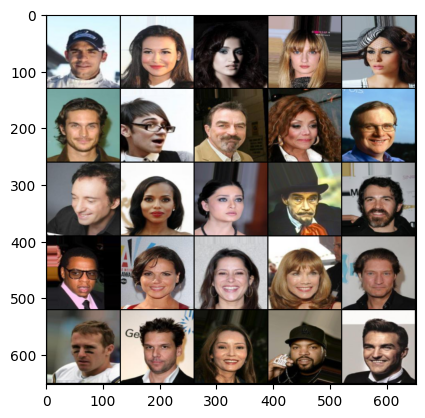

In [25]:
class Dataset(Dataset):
  def __init__(self,path,size=128,lim=10000):
    self.sizes = [size,size]
    items,labels = [],[]

    for data  in os.listdir(path)[:lim]:
      # path - './content/sample_data/img_align_celeba
      # data - '1123214.jpg'
      item = os.path.join(path,data)
      items.append(item)
      labels.append(data)
    self.items = items
    self.labels = labels

  def __len__(self):
    return len(self.items)

  def __getitem__(self,idx):
    data = PIL.Image.open(self.items[idx]).convert('RGB')   # (178,218) - size of image in celeba dataset
    data = np.asarray(torchvision.transforms.Resize(self.sizes)(data))  # 128 x 128 x 3 - convert pillow format to numpy
    data = np.transpose(data, (2,0,1)).astype(np.float32, copy=False)  # 3 x 128 x128 - this is the format required by pytorch (numpy to torch/tensor)
    data = torch.from_numpy(data).div(255)   # general image pixels are from 0 to 255, but for neural network we need 0 to 1
    return data,self.labels[idx]


# Dataset
data_path = '/content/sample_data/img_align_celeba'
ds = Dataset(data_path,size = 128,lim = 10000)

# Dataloader
dataloader = DataLoader(ds,batch_size=batch_size,shuffle = True)

# ModelsGenerator
gen = Generator(z_dim).to(device)
crit = Critic().to(device)

# Optimizers
gen_opt = torch.optim.Adam(gen.parameters(),lr=lr,betas=(0.5,0.9))
crit_opt = torch.optim.Adam(crit.parameters(),lr=lr,betas=(0.5,0.9))

# Initializations
# gen = gen.apply(init_weights)
# crit = crit.apply(init_weights)

# wanbd optional
if (wandbact==1):
  wandb.watch(gen,log_freq=100)
  wandb.watch(crit,log_freq=100)

x,y=next(iter(dataloader))
show(x)

In [15]:
## gradietnt penalty calculation

def get_gp(real,fake,crit,alpha,gamma=10):
  mix_images = real *alpha+fake*(1-alpha) #128 x 3 x 128 x 128 (images x channel x width x height) - this formula is of linear interpolation
  mix_scores = crit(mix_images)  # 128 X 1 (critic predictions for 128 images)

  # penalise gradients if they are too large
  gradient  = torch.autograd.grad(
      inputs = mix_images,
      outputs = mix_scores,
      grad_outputs = torch.ones_like(mix_scores),
      retain_graph = True,
      create_graph = True)[0]    # this will give the sum of all the gradients for the inputs  128 x 3 x 128 x 128

  gradient = gradient.view(len(gradient), -1)   # 128 x 49152(128*3*128*128)
  gradient_norm = gradient.norm(2 ,dim =1) # dim =1 means will be applied to all the 49152,  Norm of a vector is a positive number that expresses its magnitude.
  gp = gamma * ((gradient_norm-1)**2).mean()

  return gp

In [16]:
## Save and load checkpoints   - this will save the current values of the model and the optimizer

root_path = '/content/sample_data/'

def save_checkpoint(name):
  torch.save({
          'epoch':epoch,
          'model_state_dict':gen.state_dict(),
          'optimizer_state_dict':gen_opt.state_dict()
      },f"{root_path}G-{name}.pkl" )

  torch.save({
          'epoch':epoch,
          'model_state_dict':crit.state_dict(),
          'optimizer_state_dict':crit_opt.state_dict()
      },f"{root_path}C-{name}.pkl" )
  print("Saved checkpoint")

def load_checkpoint(name):
  checkpoint = torch.load(f"{root_path}G-{name}.pkl")
  gen.load_state_dict(checkpoint["model_state_dict"])
  gen_opt.load_state_dict(checkpoint["optimizer_state_dict"])

  checkpoint = torch.load(f"{root_path}C-{name}.pkl")
  crit.load_state_dict(checkpoint["model_state_dict"])
  crit_opt.load_state_dict(checkpoint["optimizer_state_dict"])

  print("Loaded checkpoint")

In [ ]:

epoch =1
# save_checkpoint("test")
load_checkpoint("test")

  0%|          | 0/79 [00:00<?, ?it/s]

Saving checkpoint:  35 35
Saved checkpoint


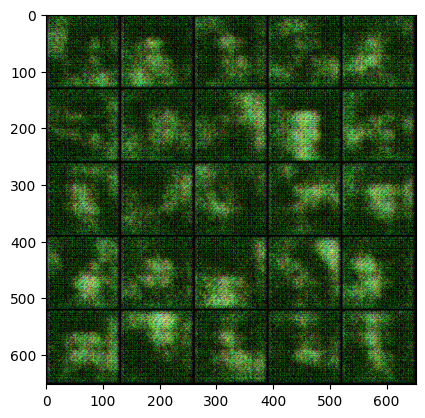

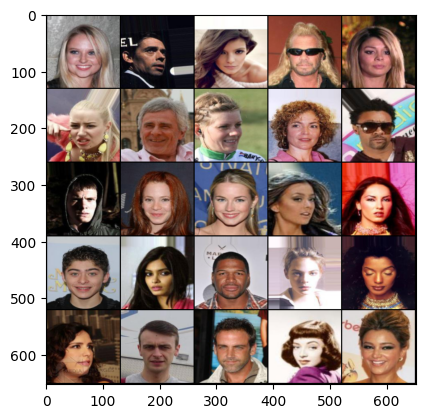

Epoch : 0: Step 35: Generator loss: 10.18929625579289: Critic loss: -2.3881825222287865


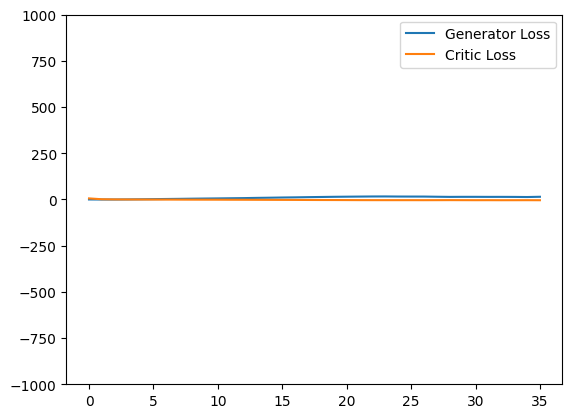

Saving checkpoint:  70 35
Saved checkpoint


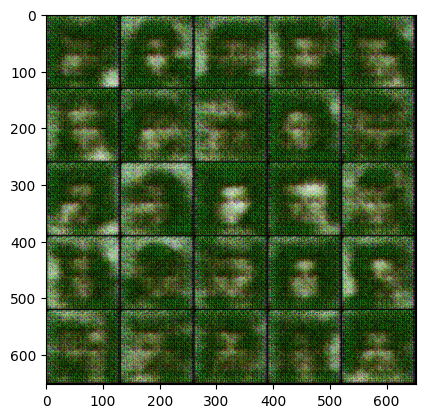

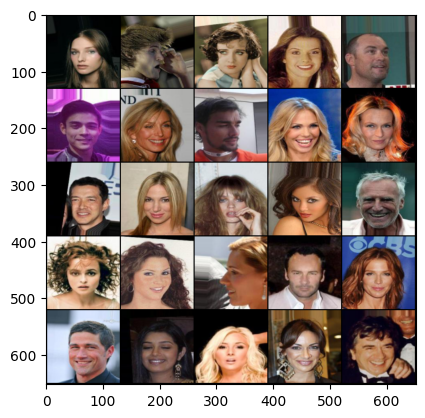

Epoch : 0: Step 70: Generator loss: 21.947726331438336: Critic loss: -5.671555949619838


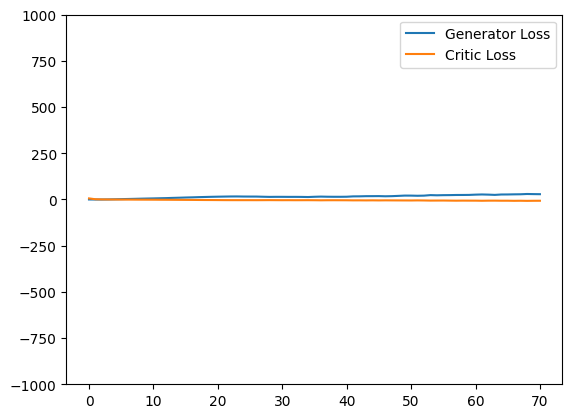

  0%|          | 0/79 [00:00<?, ?it/s]

Saving checkpoint:  105 35
Saved checkpoint


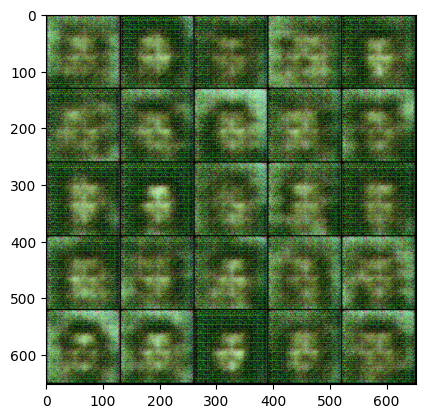

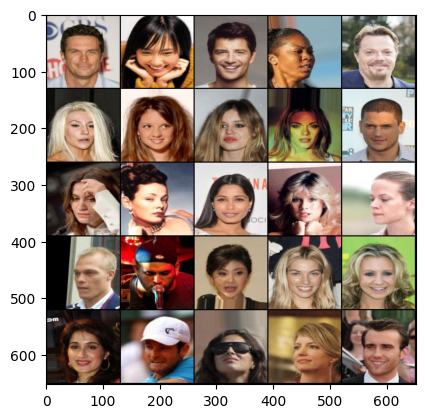

Epoch : 1: Step 105: Generator loss: 28.859990910121372: Critic loss: -6.952100688389368


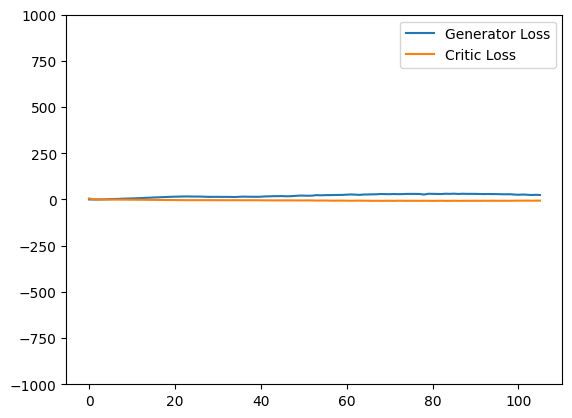

Saving checkpoint:  140 35
Saved checkpoint


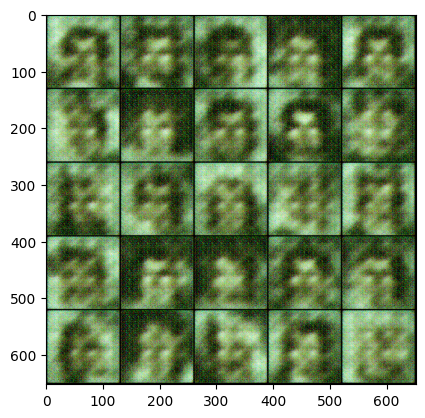

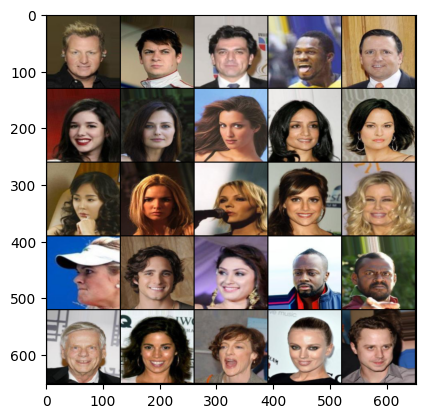

Epoch : 1: Step 140: Generator loss: 22.486092703683035: Critic loss: -4.794260439191547


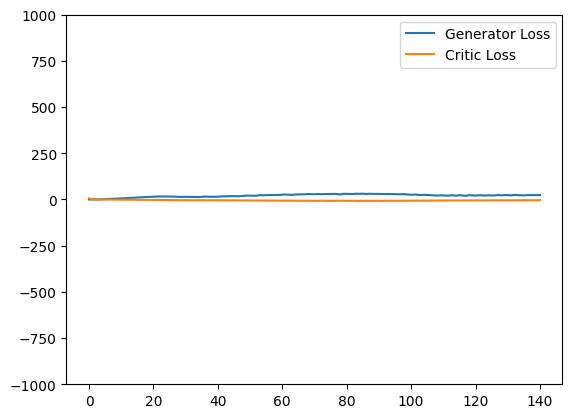

  0%|          | 0/79 [00:00<?, ?it/s]

Saving checkpoint:  175 35
Saved checkpoint


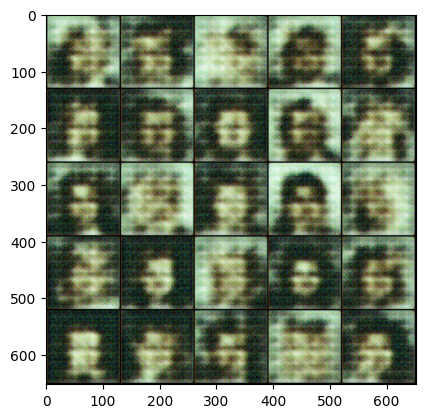

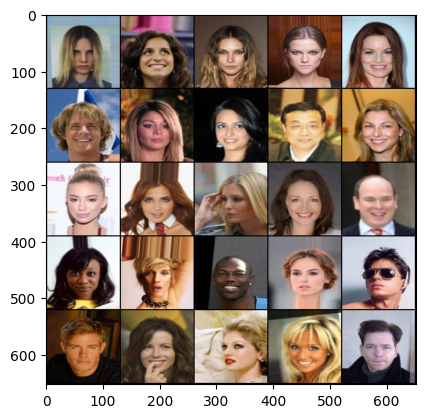

Epoch : 2: Step 175: Generator loss: 26.110539191109794: Critic loss: -4.0352475084577275


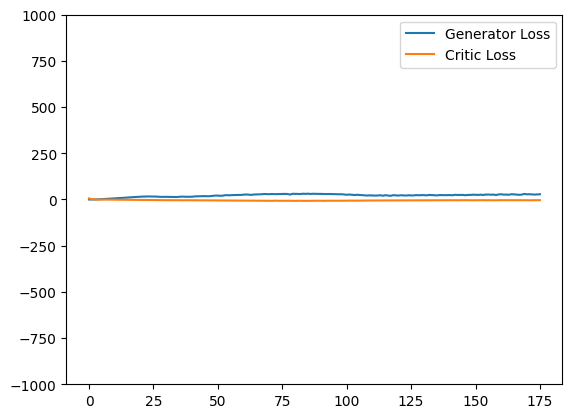

Saving checkpoint:  210 35
Saved checkpoint


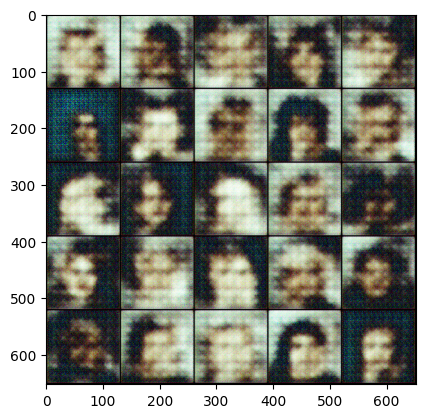

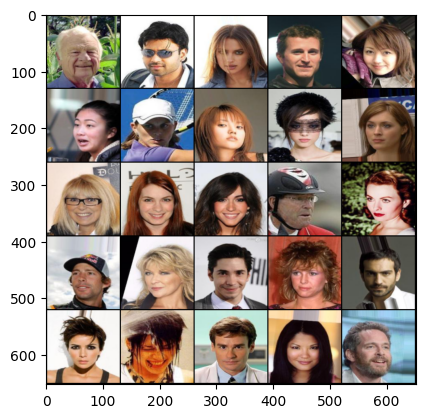

Epoch : 2: Step 210: Generator loss: 26.89368896484375: Critic loss: -3.7385865129743308


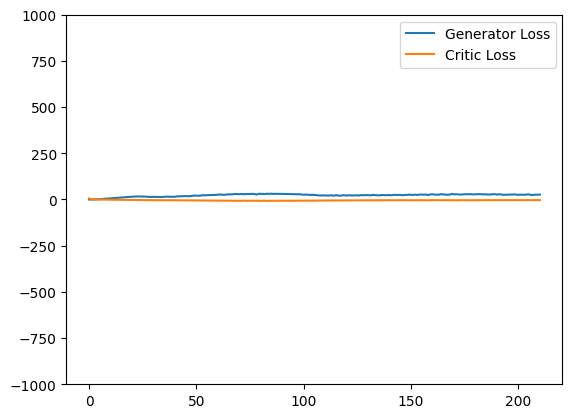

  0%|          | 0/79 [00:00<?, ?it/s]

Saving checkpoint:  245 35
Saved checkpoint


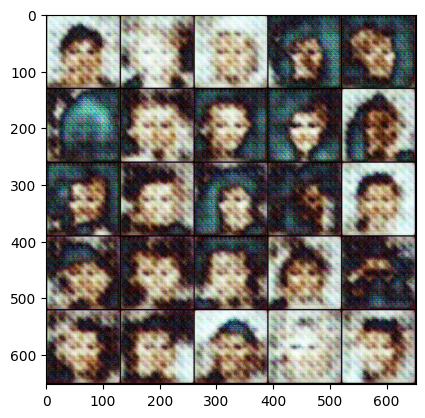

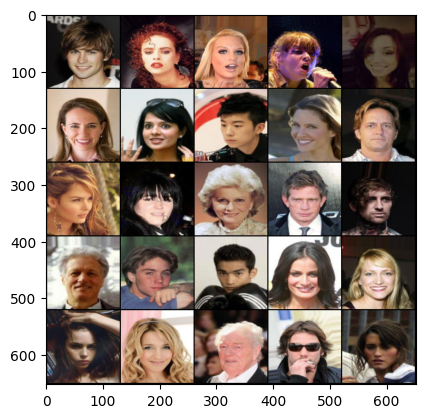

Epoch : 3: Step 245: Generator loss: 24.467281123570032: Critic loss: -3.421994051252092


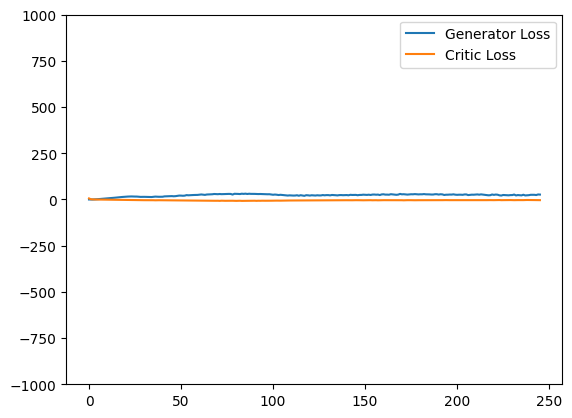

Saving checkpoint:  280 35
Saved checkpoint


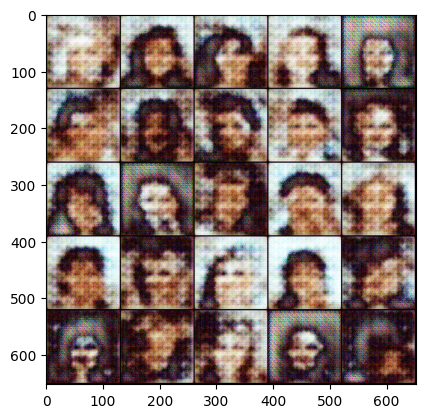

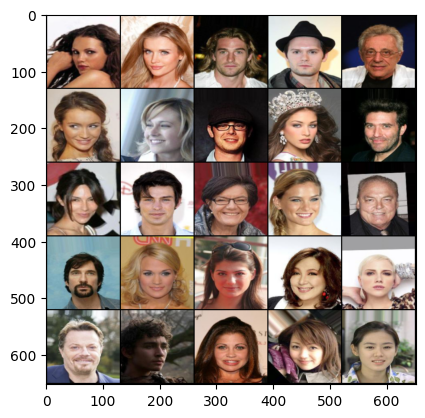

Epoch : 3: Step 280: Generator loss: 26.28261043003627: Critic loss: -3.3241249465942384


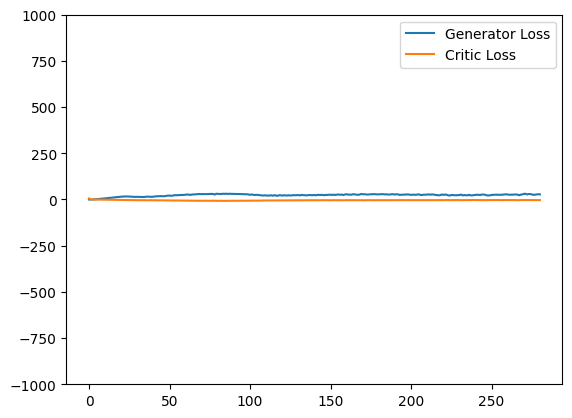

Saving checkpoint:  315 35
Saved checkpoint


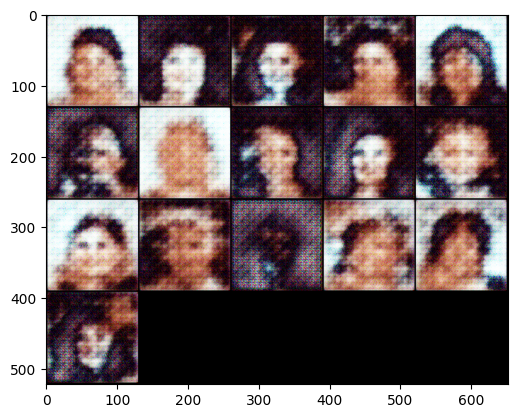

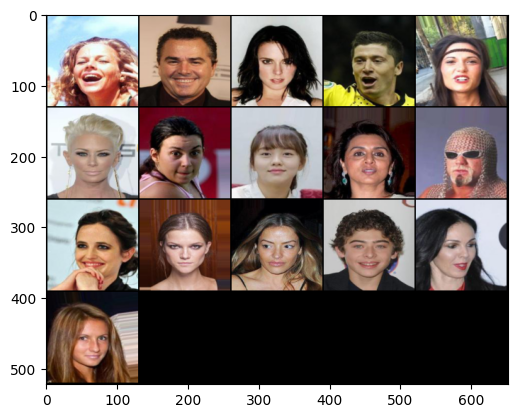

Epoch : 3: Step 315: Generator loss: 27.260497011457172: Critic loss: -3.2217881284441265


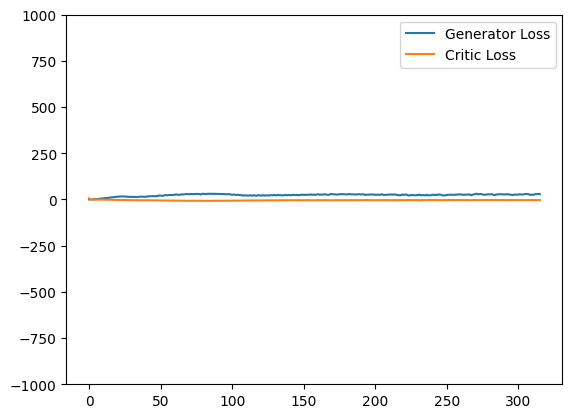

  0%|          | 0/79 [00:00<?, ?it/s]

Saving checkpoint:  350 35
Saved checkpoint


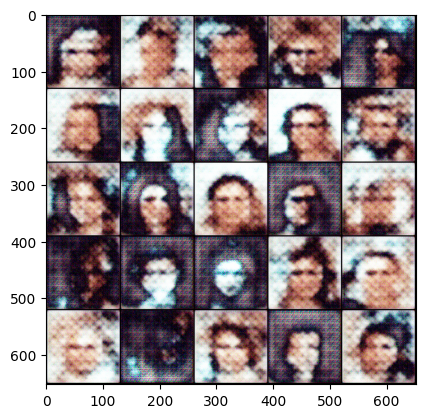

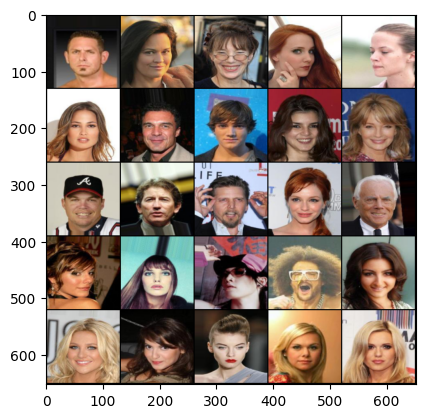

Epoch : 4: Step 350: Generator loss: 28.128282710484097: Critic loss: -3.180138468061174


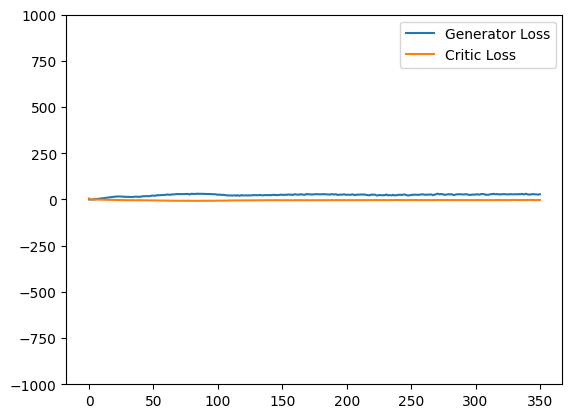

Saving checkpoint:  385 35
Saved checkpoint


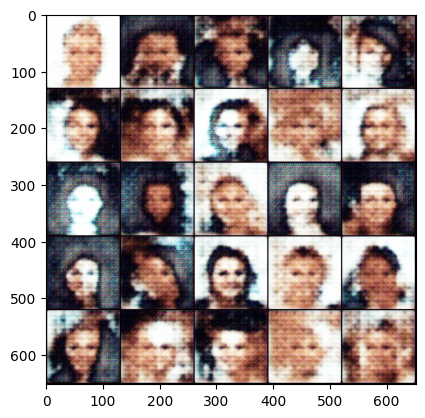

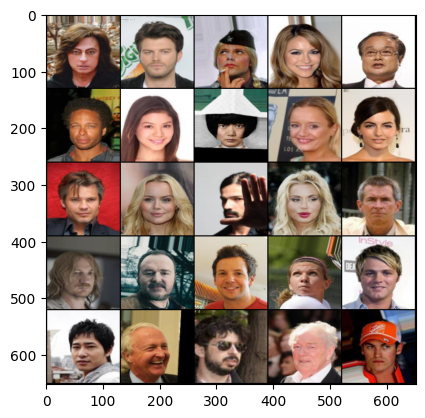

Epoch : 4: Step 385: Generator loss: 28.704779815673827: Critic loss: -3.1130195018223352


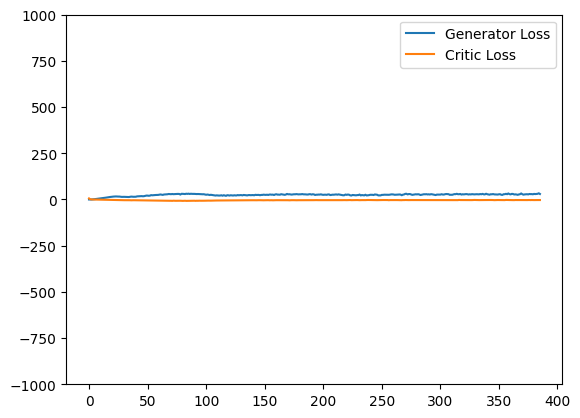

  0%|          | 0/79 [00:00<?, ?it/s]

Saving checkpoint:  420 35
Saved checkpoint


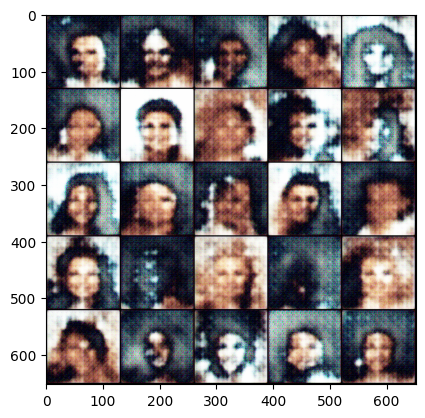

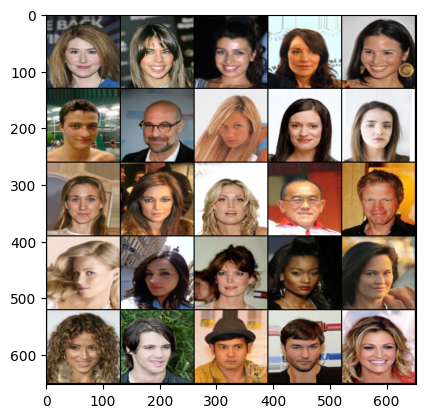

Epoch : 5: Step 420: Generator loss: 29.364206750052315: Critic loss: -3.029280662536621


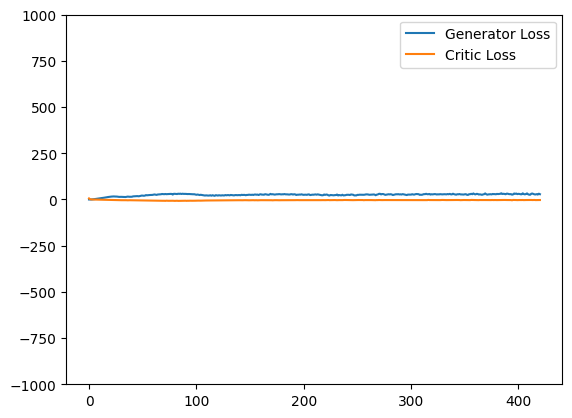

Saving checkpoint:  455 35
Saved checkpoint


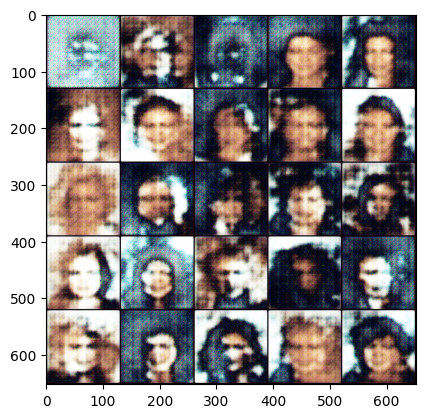

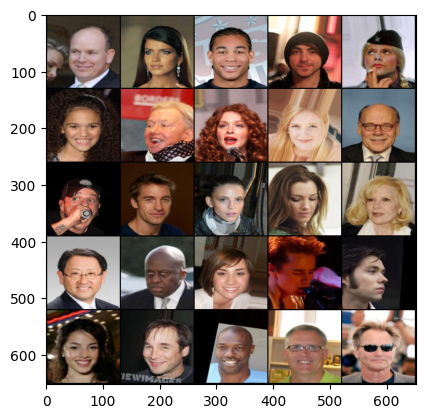

Epoch : 5: Step 455: Generator loss: 29.072605078560965: Critic loss: -2.888894751412528


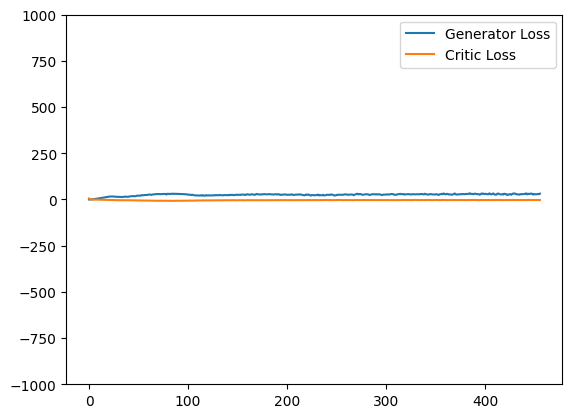

  0%|          | 0/79 [00:00<?, ?it/s]

Saving checkpoint:  490 35
Saved checkpoint


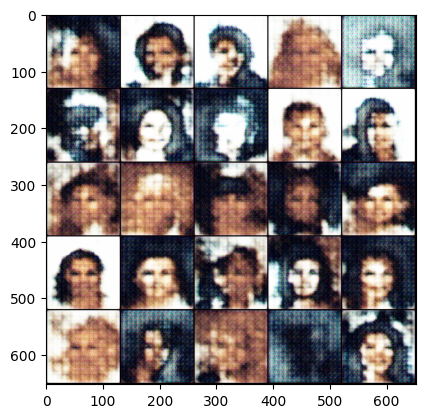

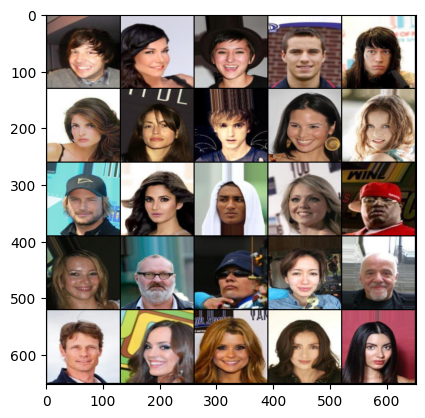

Epoch : 6: Step 490: Generator loss: 28.129766845703124: Critic loss: -2.7864047622680665


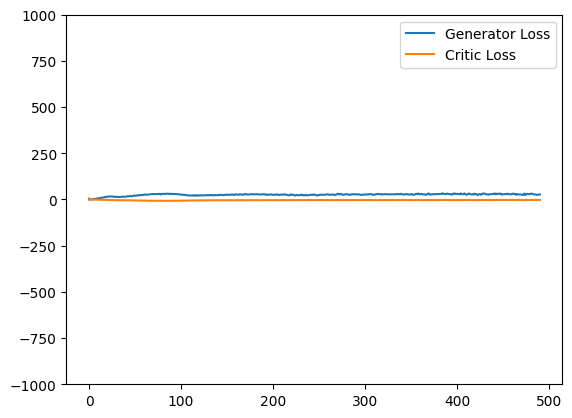

Saving checkpoint:  525 35
Saved checkpoint


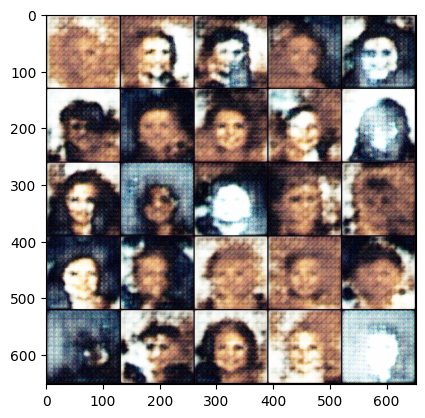

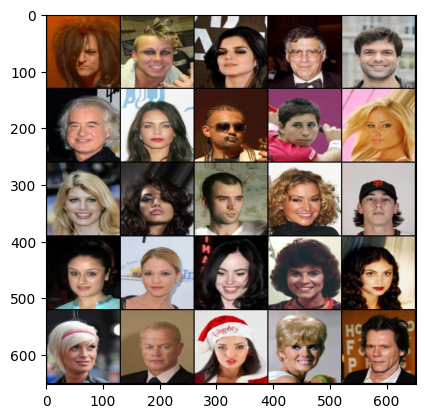

Epoch : 6: Step 525: Generator loss: 28.557012503487723: Critic loss: -2.6955489403860917


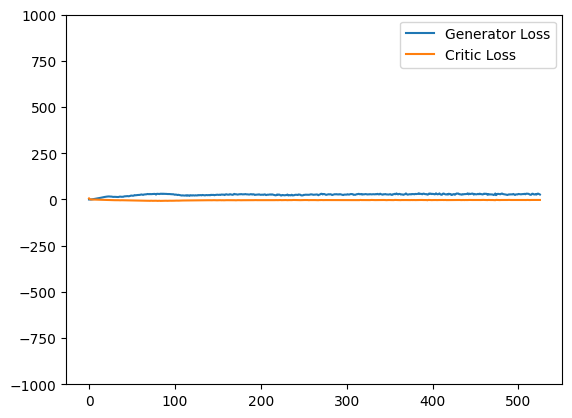

  0%|          | 0/79 [00:00<?, ?it/s]

Saving checkpoint:  560 35
Saved checkpoint


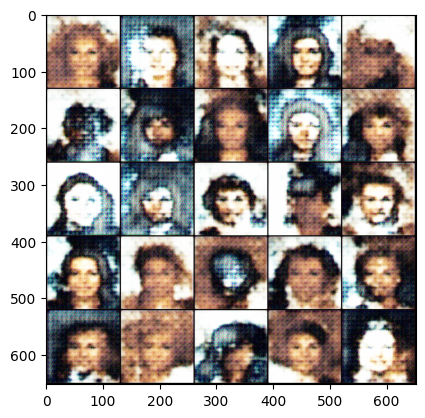

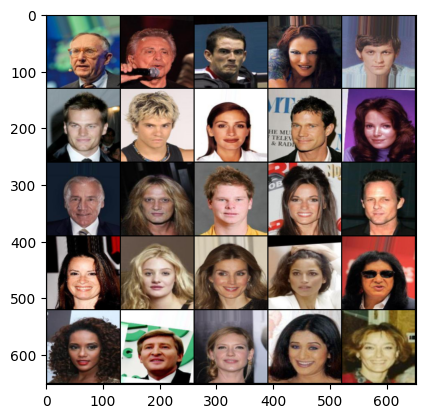

Epoch : 7: Step 560: Generator loss: 28.838696888514928: Critic loss: -2.693939181736537


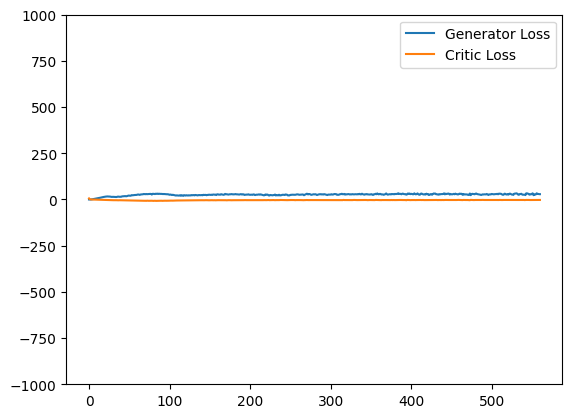

Saving checkpoint:  595 35
Saved checkpoint


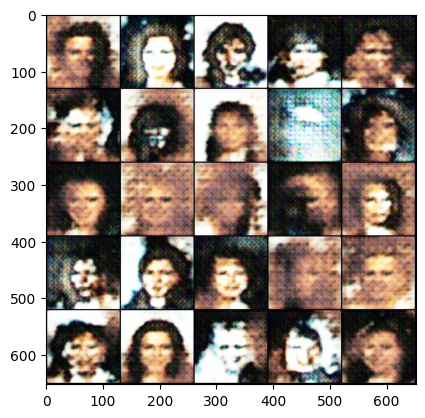

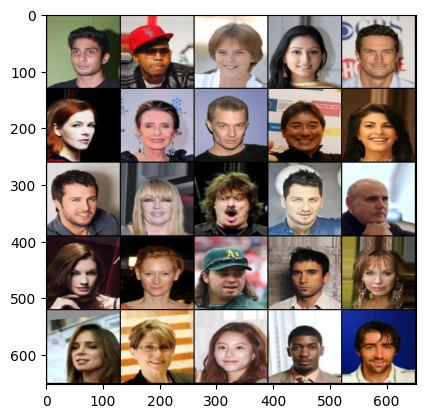

Epoch : 7: Step 595: Generator loss: 29.242185592651367: Critic loss: -2.606281972612654


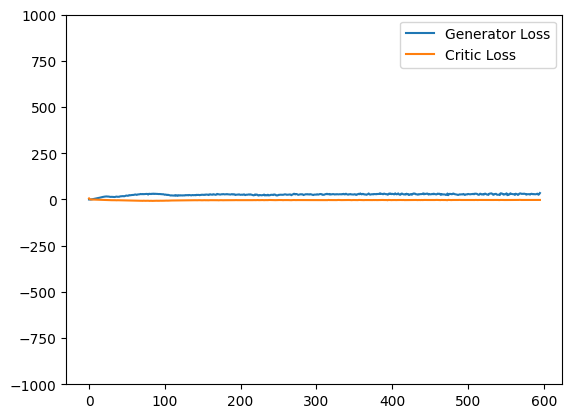

KeyboardInterrupt: ignored

In [26]:
## Training loop

for epoch in range(n_epochs):
  for real,_ in tqdm(dataloader):
    curr_bs = len(real) #128
    real = real.to(device)

    ## CRITIC -- everytime we train a generator we train the critic 5 times because this gives better performance
    mean_critic_loss = 0
    for _ in range(crit_cycles):
      crit_opt.zero_grad()

      noise = gen_noise(curr_bs,z_dim)
      fake = gen(noise)
      crit_fake_pred = crit(fake.detach()) # detach so that the generator parameters are not updated
      crit_real_pred = crit(real)

      alpha = torch.rand(len(real),1,1,1,device = device,requires_grad = True) # 128 x 1 x 1 1
      gp = get_gp(real,fake.detach(),crit,alpha)

      crit_loss = crit_fake_pred.mean() - crit_real_pred.mean() + gp
      mean_crit_loss = crit_loss.item() / crit_cycles

      crit_loss.backward(retain_graph=True)
      crit_opt.step()
    crit_losses += [mean_crit_loss]

    ## GENERATOR
    gen_opt.zero_grad()
    noise = gen_noise(curr_bs,z_dim)  # parameters are how many and dimentionality
    fake= gen(noise)
    crit_fake_pred = crit(fake)

    gen_loss = -crit_fake_pred.mean()
    gen_loss.backward()  # backpropogate
    gen_opt.step() # optimise or update the parameters

    gen_losses+=[gen_loss.item()]  #.item is a method that takes number out of a tensor

    ### Stats

    if (wandb==1):
      wandb.log({'Epoch': epoch, 'Step': cur_step, 'Critic loss': mean_crit_loss, 'Gen loss': gen_loss})

    if cur_step % save_step ==0 and cur_step >0:
      print("Saving checkpoint: ",cur_step,save_step)
      save_checkpoint("latest")


    if (cur_step % show_step == 0 and cur_step > 0):
      show(fake,wandbactive=1,name='fake')
      show(real,wandbactive=1,name='real')

      gen_mean = sum(gen_losses[-show_step:])/show_step
      crit_mean = sum(crit_losses[-show_step:])/show_step
      print(f"Epoch : {epoch}: Step {cur_step}: Generator loss: {gen_mean}: Critic loss: {crit_mean}")

      plt.plot(
          range(len(gen_losses)),
          torch.Tensor(gen_losses),
          label = "Generator Loss"
      )

      plt.plot(
          range(len(gen_losses)),
          torch.Tensor(crit_losses),
          label= "Critic Loss"
      )


      plt.ylim(-1000,1000)
      plt.legend()
      plt.show()

    cur_step+=1

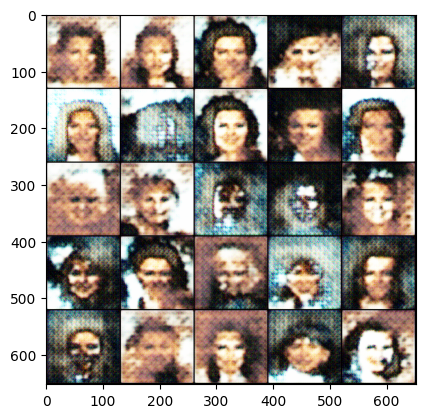

In [32]:
## Genarate new faces

noise = gen_noise(batch_size,z_dim)
fake = gen(noise)
show(fake)

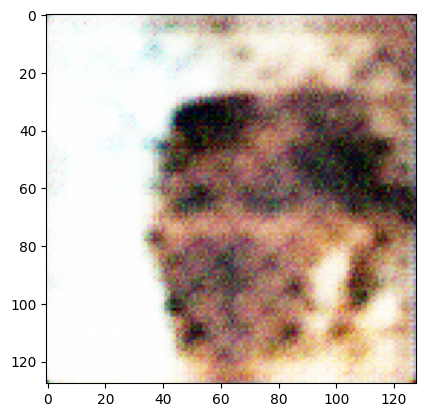

In [30]:
plt.imshow(fake[7].detach().cpu().permute(1,2,0).squeeze().clip(0,1))

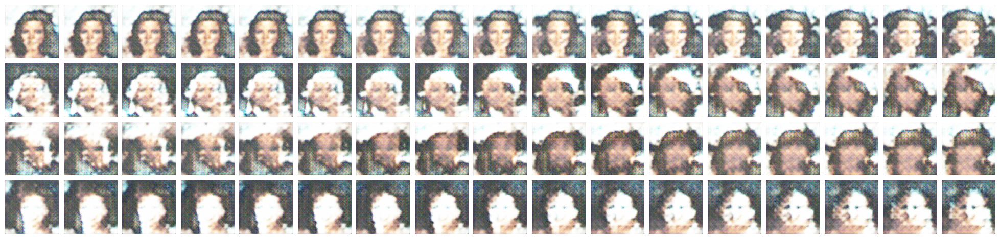

In [33]:
## Morphing - interpolation between points in latent space
from mpl_toolkits.axes_grid1 import ImageGrid

gen_set = []
z_shape = [1,200,1,1]  # [batch_size,dimension,]
rows = 4
steps =17

for i in range(rows):
  z1,z2=torch.randn(z_shape),torch.randn(z_shape)
  for alpha in np.linspace(0,1,steps):
    z = alpha*z1 + (1-alpha)*z2
    res=gen(z.cuda())[0]
    gen_set.append(res)

fig = plt.figure(figsize = (25,11))
grid = ImageGrid(fig,111,nrows_ncols=(rows,steps),axes_pad=0.1)

for ax,img in zip(grid,gen_set):
  ax.axis("off")
  res=img.cpu().detach().permute(1,2,0)
  res =res-res.min()
  res=res/(res.max()-res.min())
  ax.imshow(res)
plt.show()